In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
import cv2
from glob import glob
import random
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
from torch import nn

In [2]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(0)

In [3]:
df = pd.read_csv("../datasets/waterbird/metadata.csv")
df.head(5)

,img_id,img_filename,y,split,place,place_filename
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,1,/o/ocean/00002178.jpg
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/l/lake/natural/00000065.jpg
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,2,0,/b/bamboo_forest/00000131.jpg
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00001268.jpg
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,1,/o/ocean/00003147.jpg


In [4]:
LANDBIRD = 0
WATERBIRD = 1
LAND = 0
WATER = 1

In [5]:
train_df = df[df['split'] == 0]
val_df = df[df['split'] == 1]
test_df = df[df['split'] == 2]

len(train_df), len(test_df), len(val_df)

(4795, 5794, 1199)

In [11]:
def plot_heatmap(landbird_on_land,
                 landbird_on_water,
                 waterbird_on_water,
                 waterbird_on_land,
                 title,
                 project_on_image=False):

    root_dir = "../datasets/waterbird"
    nrows, ncols = 4, 10
    fig = plt.figure(figsize=(25, 40))

    subfigs = fig.subfigures(nrows, 1)
    subfig_titles = ['landbird on land', 'landbird on water',
                     'waterbird on water', 'waterbird on land']

    for subfig, subtitle, entry in zip(subfigs, subfig_titles, [landbird_on_land, landbird_on_water, waterbird_on_water, waterbird_on_land]):

        axs = subfig.subplots(4, ncols)
        subfig.suptitle(subtitle, fontsize=17,  ha='center',
                        va='top', x=0.5, y=0.94)
        idx = 0

        for i in range(ncols):
            img_path = os.path.join(root_dir, entry[idx]['img_filename'])
            img = Image.open(img_path)
            img = img.resize((500, 500))
            axs[0, i].imshow(img)
            axs[0, i].axis('off')
            # axs[0, i].set_title(f"true: {entry[idx]['img_label']} | pred: {entry[idx]['predicted']}")

            heatmap = entry[idx]['heatmap']
            heatmap = cv2.resize(heatmap, (500, 500))
            if project_on_image:
                axs[1, i].imshow(img)
                axs[1, i].imshow(heatmap, cmap='jet', alpha=0.5)
            else:
                axs[1, i].imshow(heatmap, cmap='jet', alpha=0.85)
            axs[1, i].axis('off')

            img_path = os.path.join(root_dir, entry[idx + ncols]['img_filename'])
            img = Image.open(img_path)
            img = img.resize((500, 500))
            axs[2, i].imshow(img)
            axs[2, i].axis('off')
            # axs[2, i].set_title(f"true: {entry[idx + ncols]['img_label']} | pred: {entry[idx + ncols]['predicted']}")

            heatmap = entry[idx + ncols]['heatmap']
            heatmap = cv2.resize(heatmap, (500, 500))
            if project_on_image:
                axs[3, i].imshow(img)
                axs[3, i].imshow(heatmap, cmap='jet', alpha=0.5)
            else:
                axs[3, i].imshow(heatmap, cmap='jet', alpha=0.85)
            axs[3, i].axis('off')
            idx += 1
    

    fig.suptitle(title, fontsize=20,
                 ha='center', va='top', x=0.5, y=1.01)
    plt.subplots_adjust(hspace=0.01, wspace=0.01)
    plt.show()

In [12]:
performance_report = np.load("D:\Download\Waterbird\PaliGemma\landbird_or_waterbird\landbird_or_waterbird_activations.npy", allow_pickle=True)

# for entry in performance_report:
#     if entry['predicted'] == 'landbird':
#         entry['predicted'] = LANDBIRD
#     else:
#         entry['predicted'] = WATERBIRD
# true_labels = [x['img_label'] for x in performance_report]
# predicted_labels = [x['predicted'] for x in performance_report]
# place = [x['place'] for x in performance_report]

170 177 76 76


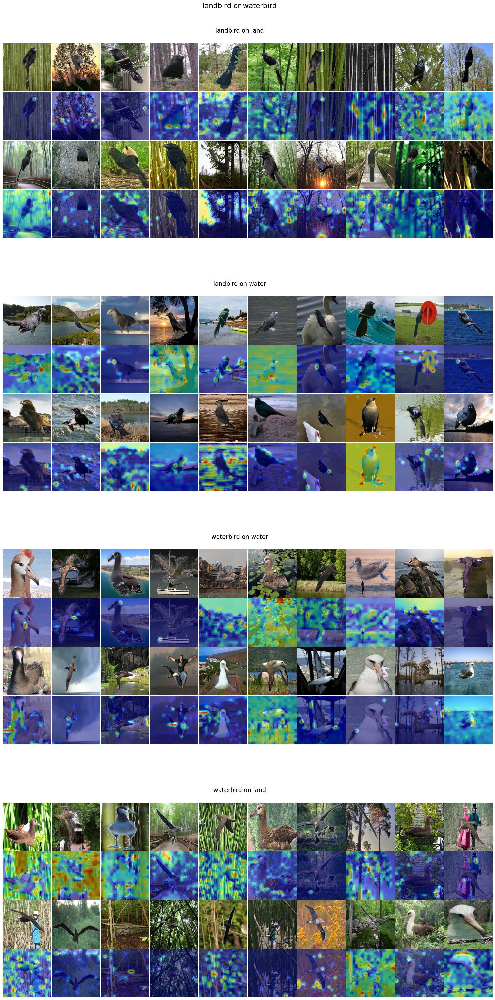

In [13]:
landbird_on_land = []
landbird_on_water = []
waterbird_on_land = []
waterbird_on_water = []

for entry in performance_report:
    if entry['img_label'] == LANDBIRD and entry['place'] == LAND:
        landbird_on_land.append(entry)

    elif entry['img_label'] == LANDBIRD and entry['place'] == WATER:
        landbird_on_water.append(entry)

    elif entry['img_label'] == WATERBIRD and entry['place'] == LAND:
        waterbird_on_land.append(entry)
        

    elif entry['img_label'] == WATERBIRD and entry['place'] == WATER:
        waterbird_on_water.append(entry)

print(len(landbird_on_land), len(landbird_on_water), len(waterbird_on_water), len(waterbird_on_water))


plot_heatmap(landbird_on_land,
             landbird_on_water,
             waterbird_on_water,
             waterbird_on_land,
             title='landbird or waterbird',
             project_on_image=True)